# **HOWEWORK Introduction to Computer Vision 2024**

**Initial requirements:**

- Cheating policy is 0 points in the Assignment

- Late submission -10% per day

- Deadline 25.09.2024 23:59


Please read a description of assignments carefully to understand what you are required to do in each task

reference: some of the code is from labs of this course

In [8]:
# Helping functions

from matplotlib import pyplot as plt
from IPython.display import clear_output
import numpy as np
import time
import cv2


def read_and_resize(filename, grayscale = False, resize = False, fx= 0.5, fy=0.5):
    if grayscale:
      img_result = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    else:
      imgbgr = cv2.imread(filename, cv2.IMREAD_COLOR)
      # convert to rgb
      img_result = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
    # resize
    if resize:
        img_result = cv2.resize(img_result, None, fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
    return img_result


def showInRow(list_of_images, titles = None, disable_ticks = False):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])

    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
    if disable_ticks:
      plt.xticks([]), plt.yticks([])
  plt.show()

## TASK 1 (4 points)

In this assignment you need to segment lake from the forest around using  thresholding and edge detection.
Basically, the process relies on several steps:

1) Make image processing that you think could be useful specifically for that case

2) Apply thresholding to the processed image

3) Additionally could make some morphological treatment (don't forget blurring could be useful beforehand). It might also require an appropriate kernel.

4) Find contours and show results by drawing them on the initial image

Requirements:

1) Minor artefacts are allowed, but lake should be contoured almost entirely with some small overlapping with a coastline.

2) Segmentaiton should be visually reconizable.

3) Arrange your code appropriately to complete the task

In [9]:
%matplotlib inline
from matplotlib import pyplot as plt
from IPython.display import clear_output
import numpy as np
import time
import cv2

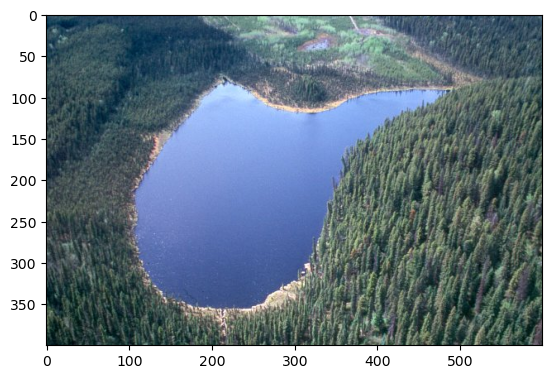

In [10]:

lake = read_and_resize('lake.jpg')
showInRow([lake])

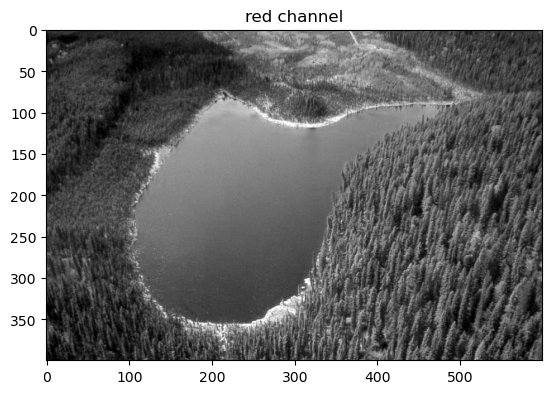

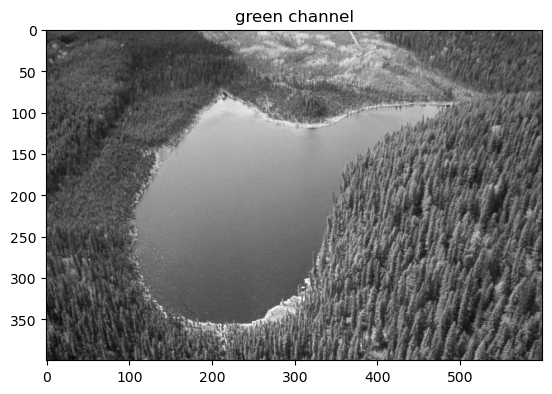

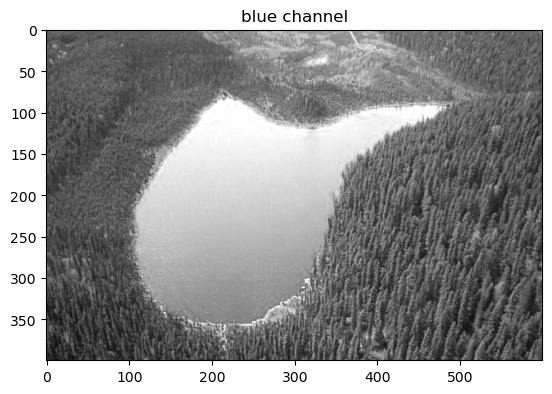

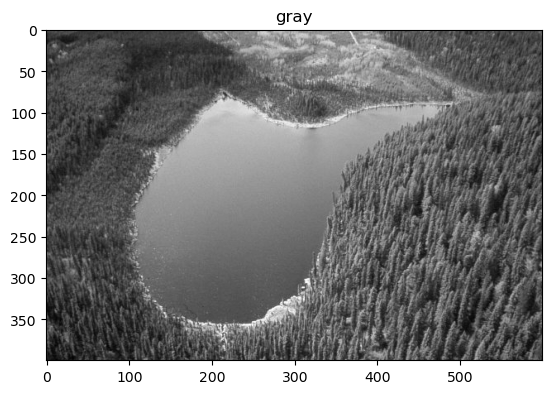

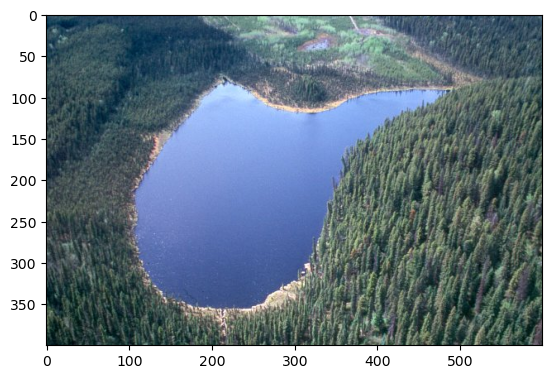

In [11]:
imgrgb = lake
# split color image on channels using python indexing
img_r,img_g,img_b = imgrgb[:,:,0], imgrgb[:,:,1], imgrgb[:,:,2]

plt.imshow(img_r, cmap = 'gray')
plt.title('red channel')
plt.show()
plt.imshow(img_g, cmap = 'gray')
plt.title('green channel')
plt.show()
plt.imshow(img_b, cmap = 'gray')
plt.title('blue channel')
plt.show()
processed_img = cv2.cvtColor(imgrgb, cv2.COLOR_RGB2GRAY)
plt.imshow(processed_img, cmap = 'gray')
plt.title('gray')
plt.show()
# merge color channels
img_merged = cv2.merge((img_r,img_g,img_b))
plt.imshow(img_merged)
plt.show()

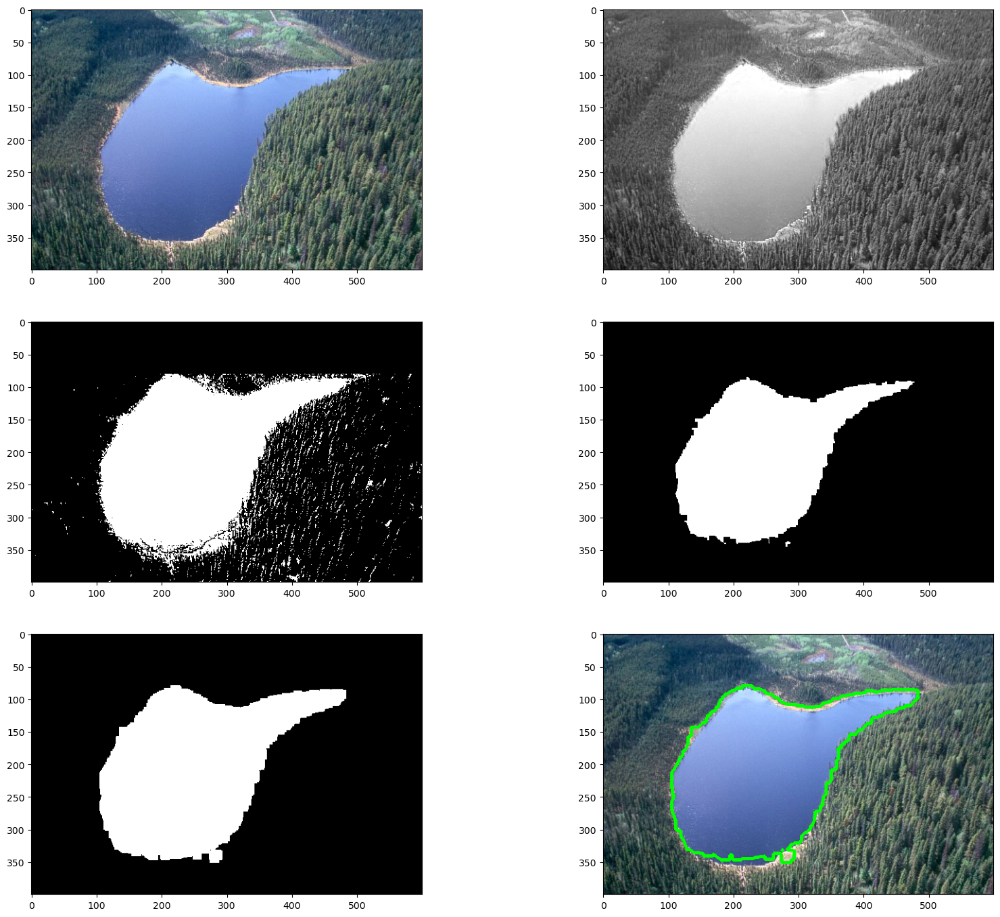

In [32]:
def image_process(img):

    processed_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # plt.subplot(111),plt.imshow(processed_img,cmap = 'gray')
    return img[:,:,2]


def thresholding(processed_img):
    ret, final_thresh = cv2.threshold(processed_img, 133, 255, cv2.THRESH_BINARY)

    final_thresh[:(final_thresh.shape[0]-320),:] = 0
    return final_thresh


def kernel():
    kernel = np.ones((5,5),np.uint8)
    return kernel


def morphological_ops(img_after_thresholding, kernel):
    ero = cv2.erode(img_after_thresholding,kernel,iterations = 2)   
    dil = cv2.dilate(ero,kernel,iterations = 3)   

    return ero, dil


def contour_find(detect_img):
    contours, hierarchy = cv2.findContours(detect_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours


def contour_drawing(contours, initial_img):
    im2 = cv2.drawContours(initial_img, contours, -1, (255, 0, 0))
    img_contours=initial_img.copy()

    print('Contours type is: {}'.format(type(contours)))
    print('Number of contours: {}'.format(len(contours)))
    print('Each contour is: {}'.format(type(contours[0])))
    print('Contour array shape is: {}'.format(contours[0].shape))

    # draw contours on input image
    cv2.drawContours(img_contours, contours, -1, (255,0,0), 3)

    plt.subplot(131),plt.imshow(initial_img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(132),plt.imshow(img_contours,cmap = 'gray')
    plt.title('Image with contours'), plt.xticks([]), plt.yticks([])
    plt.subplot(133),plt.imshow(im2,cmap = 'gray')
    plt.title('Threshold image with contours'), plt.xticks([]), plt.yticks([])

    plt.show()

def main(img):
    fig = plt.figure(figsize=(20, 17)) 
    rows, columns = 3, 2

    fig.add_subplot(rows, columns, 1) 
    plt.imshow(img,cmap = 'gray')
    
    processed_img = image_process(img)
    fig.add_subplot(rows, columns, 2) 
    plt.imshow(processed_img,cmap = 'gray')
    
    img_aft = thresholding(processed_img)
    fig.add_subplot(rows, columns, 3) 
    plt.imshow(img_aft,cmap = 'gray')

    dil, ero = morphological_ops(img_aft, kernel())
    fig.add_subplot(rows, columns, 4) 
    plt.imshow(dil,cmap = 'gray')
    fig.add_subplot(rows, columns, 5) 
    plt.imshow(ero,cmap = 'gray')

    contours = contour_find(ero)
    im2 = cv2.drawContours(img.copy(), contours, -1, (0, 255, 0), 3)
    fig.add_subplot(rows, columns, 6) 
    plt.imshow(im2)

    # plt.subplot(231),plt.imshow(img_aft,cmap = 'gray')
    # contour_drawing(contour_find(img_aft),img_aft)
main(lake)

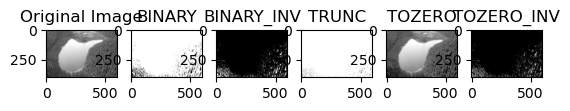

In [33]:
#@title Threshold { run: "auto" }
thresh_val = 50 #@param {type:"slider", min:0, max:255, step:1}
processed_img = image_process(lake)
ret,thresh1 = cv2.threshold(processed_img,thresh_val,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(processed_img,thresh_val,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(processed_img,thresh_val,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(processed_img,thresh_val,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(processed_img,thresh_val,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [processed_img, thresh1, thresh2, thresh3, thresh4, thresh5]

showInRow(images, titles)

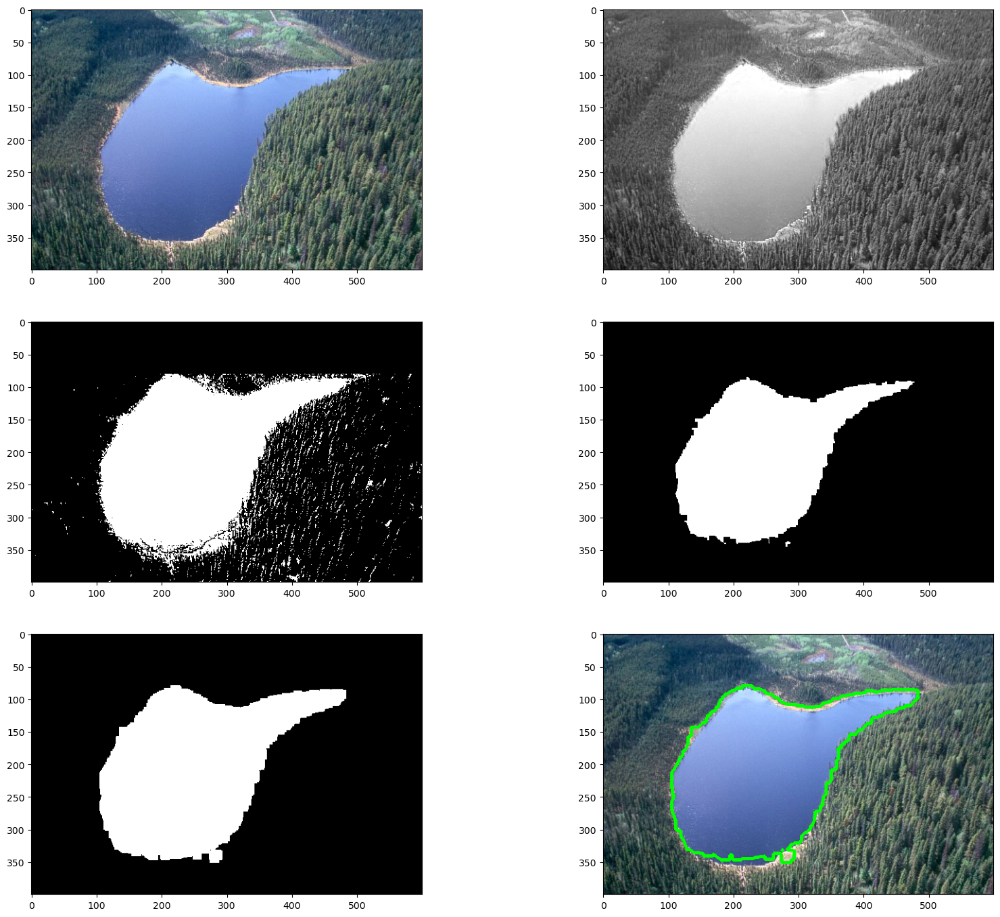

In [34]:
# from google.colab.patches import cv2_imshow
main(lake)

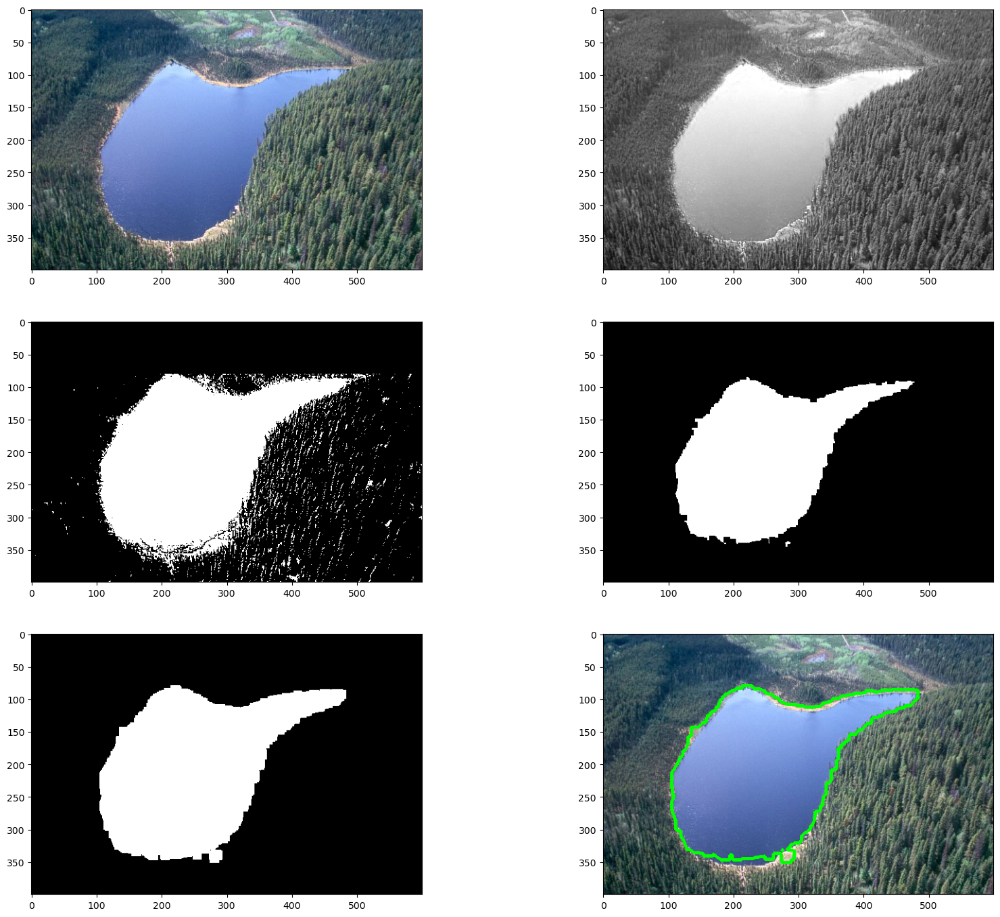

In [35]:
# from google.colab.patches import cv2_imshow
main(lake)

## TASK 2 (6 points)
In this task you are asked to count a number of cars on a parking area using Connected Components approach.
The work includes:

1) Make an appropriate processing

2) Apply an appropriate thresholding(-s) technique(-s)

3) Make an after thrsholding processing

4) Apply Connected Components Labeling to count whole set of cars

Requirements:

1) All cars should be counted on the parking lots

2) Parking lines should be excluded and not counted as objects

3) Counting should be made only within the Connected Components method with a clear centroid on each car (one centroid per car)

In [36]:
import cv2
# from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

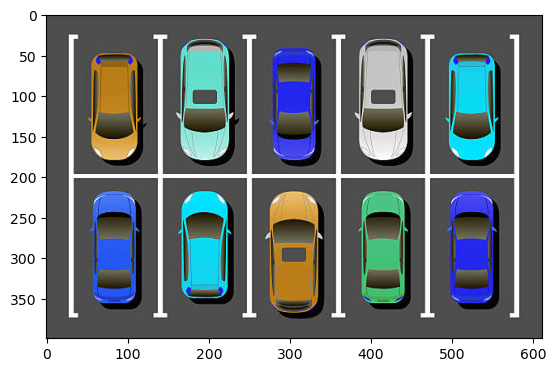

In [37]:
parking_lots = cv2.imread('parking_lot.jpg')
showInRow([parking_lots])

Found 10 labels!


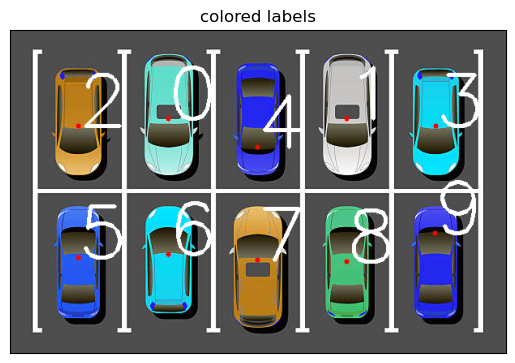

In [38]:
def open_image(path):
    img = cv2.imread(path)
    return img


def processing_image(opened_img):
    processed_img = cv2.cvtColor(opened_img, cv2.COLOR_RGB2GRAY)
    return processed_img


def kernel(x, y):

    return kernel


def thresholding(processed_image, thresh_val):
    ret, final_operation = cv2.threshold(processed_image,thresh_val,255,cv2.THRESH_BINARY)
    return final_operation

def post_process(thre):
    kernel = np.ones((5, 5), np.uint8)
    erosion = cv2.erode(thre, kernel, iterations=2)

    kernel = np.ones((7, 7), np.uint8)
    dilation = cv2.dilate(erosion, kernel, iterations=4)
    kernel = np.ones((3, 3), np.uint8)
    dilation = cv2.dilate(dilation, kernel, iterations=7)
    return erosion, dilation

def generate_colors(num):
  r = lambda: np.random.randint(0,255)
  return [(r(),r(),r()) for _ in range(num)]

def connected_components(initial_image, processed_image, connectivity = 1):
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(processed_image, connectivity, cv2.CV_32S)

    # Use the labels to color the coins you have found, draw a circle into their
    # centroids and draw their ID/index next to the centroid!
    colors = generate_colors(n_labels)

    labeled_image = np.zeros((processed_image.shape[0],processed_image.shape[1],3), dtype=np.uint8)
    labeled_image = initial_image.copy()
    # loop over all components and determine if it is a number
    for (i, label) in enumerate(range(1, n_labels)):
        # labeled_image[labels == label,:]= colors[i]
        # centroid coordinates
        cent_x, cent_y = int(centroids[label,0]), int(centroids[label,1])
        cv2.circle(labeled_image,(cent_x, cent_y), 3, (255,0,0), -1)
        cv2.putText(labeled_image, str(i), (cent_x, cent_y), cv2.FONT_HERSHEY_SIMPLEX, 3,(255,255,255),3)

        # print('labeled component {}'.format(i))
        # print('leftmost coordinate {}'.format(stats[label, cv2.CC_STAT_LEFT]))
        # print('top coordinate {}'.format(stats[label, cv2.CC_STAT_TOP ]))
        # print('cc width {}'.format(stats[label, cv2.CC_STAT_WIDTH]))
        # print('cc height {}'.format(stats[label, cv2.CC_STAT_HEIGHT ]))
        # print('cc area {}'.format(stats[label, cv2.CC_STAT_AREA]))
        # print('================================================')


    print(f"Found {n_labels-1} labels!")
    plt.title('colored labels')
    plt.xticks([]),plt.yticks([])
    plt.imshow(labeled_image)
    plt.show()


def main(initial_image_path):
    img = open_image(initial_image_path)
    pre = processing_image(img)
    thre = thresholding(pre, 80)
    pp, pp2 = post_process(thre)
    connected_components(img, pp2)
    # showInRow([img, pre, thre, pp, pp2])



main('parking_lot.jpg')

Found 10 labels!


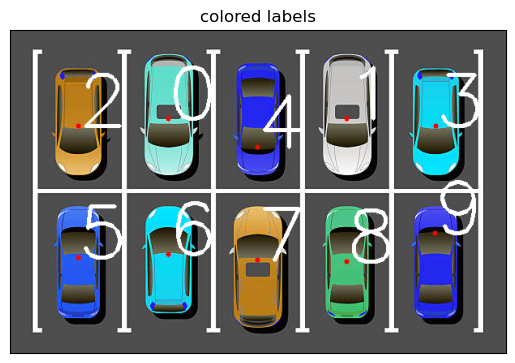

In [39]:
main('parking_lot.jpg')

In [40]:
import numpy as np
import cv2
import io
from scipy.signal import convolve2d, correlate2d
import matplotlib as plt
from sklearn.feature_extraction.image import extract_patches_2d

---
# Task 3: Cross-correlation (6 points)

Cross-correlation of two 2D signals $f$ and $g$ is defined as follows:
$$(f\star{g})[m,n]=\sum_{i=-\infty}^\infty\sum_{j=-\infty}^\infty f[i,j]\cdot g[i-m,j-n]$$

In [41]:
import matplotlib.pyplot as plt

### Template Matching with Cross-correlation
Suppose that you are a clerk at a grocery store. One of your responsibilites is to check the shelves periodically and stock them up whenever there are sold-out items. You got tired of this laborious task and decided to build a computer vision system that keeps track of the items on the shelf.


The template of a product (`template.jpg`) and the image of shelf (`shelf.jpg`) is provided. We will use cross-correlation to find the product in the shelf.


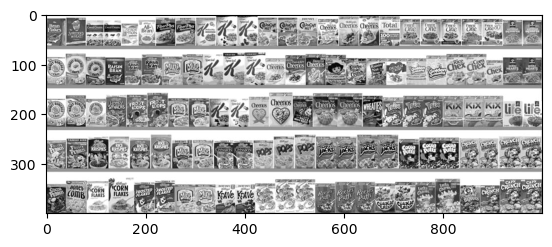

In [42]:
# Load template and image in grayscale
shelf = read_and_resize('SHELF.JPG', grayscale=True)
showInRow([shelf])

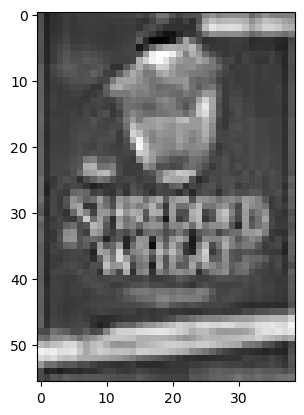

In [43]:
# Load template and image in grayscale
template = read_and_resize('template.JPG', grayscale=True)
showInRow([template])

In [44]:
import numpy as np

def zero_pad(image, pad_height, pad_width):
    """ Zero-pad an image.

    Ex: a 1x1 image [[1]] with pad_height = 1, pad_width = 2 becomes:

        [[0, 0, 0, 0, 0],
         [0, 0, 1, 0, 0],
         [0, 0, 0, 0, 0]]         of shape (3, 5)

    Args:
        image: numpy array of shape (H, W).
        pad_width: width of the zero padding (left and right padding).
        pad_height: height of the zero padding (bottom and top padding).

    Returns:
        out: numpy array of shape (H+2*pad_height, W+2*pad_width).
    """

    H, W = image.shape

    # Create a new zero-padded array
    out = np.zeros((H + 2 * pad_height, W + 2 * pad_width))

    # Place the original image in the center
    out[pad_height:H + pad_height, pad_width:W + pad_width] = image

    return out


In [45]:
import numpy as np

def conv_fast(image, kernel):
    """ An efficient implementation of convolution filter.

    This function uses element-wise multiplication and np.sum()
    to efficiently compute weighted sum of neighborhood at each
    pixel.

    Args:
        image: numpy array of shape (Hi, Wi).
        kernel: numpy array of shape (Hk, Wk).

    Returns:
        out: numpy array of shape (Hi, Wi).
    """
    Hi, Wi = image.shape
    Hk, Wk = kernel.shape
    out = np.zeros((Hi, Wi))

    # Step 1: Zero-pad the image
    pad_height = Hk // 2
    pad_width = Wk // 2
    padded_image = zero_pad(image, pad_height, pad_width)

    # Step 2: Flip the kernel
    flipped_kernel = np.flip(kernel)

    # Step 3: Perform convolution using nested loops
    for i in range(Hi):
        for j in range(Wi):
            # Extract the region of interest in the padded image
            region = padded_image[i:i + Hk, j:j + Wk]
            # Perform element-wise multiplication and sum the result
            out[i, j] = np.sum(region * flipped_kernel)

    return out


In [46]:
def cross_correlation(f, g):
    """ Cross-correlation of f and g.

    Args:
        f: numpy array of shape (Hf, Wf).
        g: numpy array of shape (Hg, Wg).

    Returns:
        out: numpy array of shape (Hf, Wf).
    """
    # Use conv_fast without flipping g (kernel)
    out = conv_fast(f, g)

    return out


In [47]:
# Perform cross-correlation between the image and the template
out = cross_correlation(shelf, template)

# Find the location with maximum similarity
y,x = (np.unravel_index(out.argmax(), out.shape))
out.argmax()

177399

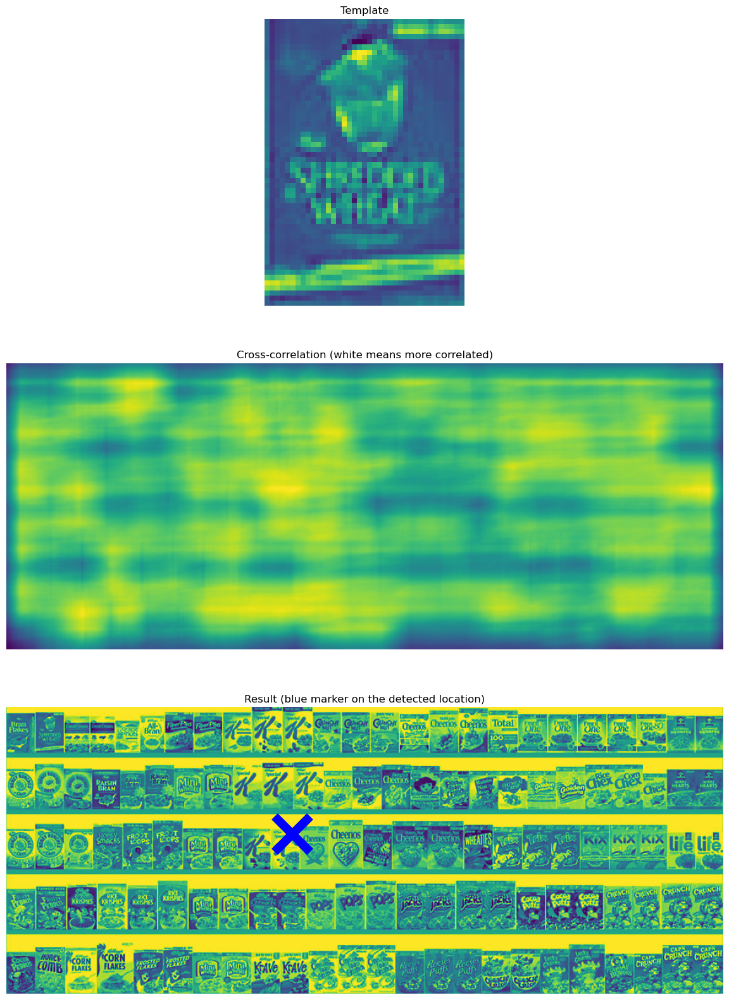

In [48]:
# Display product template
plt.figure(figsize=(25,20))
plt.subplot(3, 1, 1)
plt.imshow(template)
plt.title('Template')
plt.axis('off')

# Display cross-correlation output
plt.subplot(3, 1, 2)
plt.imshow(out)
plt.title('Cross-correlation (white means more correlated)')
plt.axis('off')

# Display image
plt.subplot(3, 1, 3)
plt.imshow(shelf)
plt.title('Result (blue marker on the detected location)')
plt.axis('off')

# Draw marker at detected location
plt.plot(x, y, 'bx', ms=40, mew=10)
plt.show()


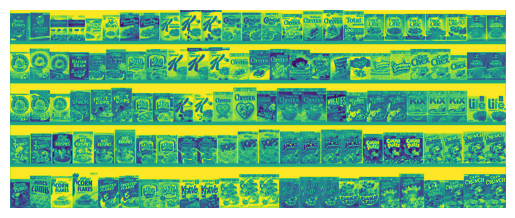

product found


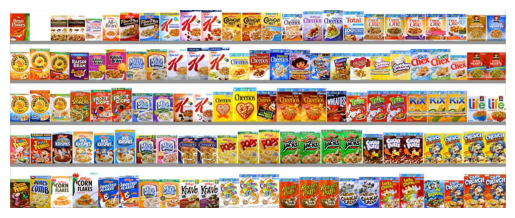

product missing


In [49]:
def check_product_on_shelf(shelf, product):
    ## YOUR CODE HERE
    ## END YOUR CODE
    out = cross_correlation(shelf, product)
    if out.argmax() > 177000:
        print("product found")
    else:
        print("product missing")

# Load image of the shelf without the product
img2 = read_and_resize('shelf_soldout.jpg')
img2_grey = read_and_resize('shelf_soldout.jpg', grayscale =True)

plt.imshow(shelf)
plt.axis('off')
plt.show()
check_product_on_shelf(shelf, template)

plt.imshow(img2)
plt.axis('off')
plt.show()
check_product_on_shelf(img2_grey, template)


---
### Normalized Cross-correlation


In [50]:
import numpy as np

def normalized_cross_correlation(f, g):
    """ Normalized cross-correlation of f and g.

    Normalize the subimage of f and the template g at each step
    before computing the weighted sum of the two.

    Args:
        f: numpy array of shape (Hf, Wf).
        g: numpy array of shape (Hg, Wg).

    Returns:
        out: numpy array of shape (Hf, Wf).
    """
    Hf, Wf = f.shape
    Hg, Wg = g.shape
    out = np.zeros((Hf, Wf))

    # Pad the image to handle the edges
    pad_height = Hg // 2
    pad_width = Wg // 2
    padded_f = zero_pad(f, pad_height, pad_width)

    # Normalize the template g
    g_mean = np.mean(g)
    g_std = np.std(g)
    g_normalized = (g - g_mean) / g_std

    # Perform normalized cross-correlation
    for i in range(Hf):
        for j in range(Wf):
            # Extract the subimage (region) from padded_f
            sub_image = padded_f[i:i + Hg, j:j + Wg]
            
            # Normalize the subimage
            sub_image_mean = np.mean(sub_image)
            sub_image_std = np.std(sub_image)
            if sub_image_std != 0:
                sub_image_normalized = (sub_image - sub_image_mean) / sub_image_std
            else:
                sub_image_normalized = sub_image - sub_image_mean  # Avoid division by zero

            # Compute the normalized cross-correlation for this pixel
            out[i, j] = np.sum(sub_image_normalized * g_normalized)

    return out


In [51]:
# Perform normalized cross-correlation between the image and the template
out = normalized_cross_correlation(shelf, template)

# Find the location with maximum similarity
y,x = (np.unravel_index(out.argmax(), out.shape))


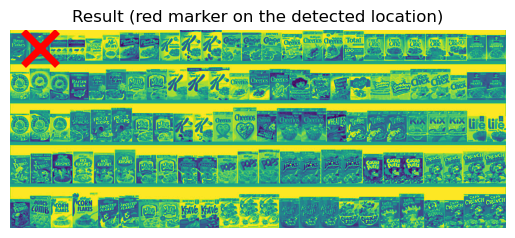

In [52]:
# Display image
plt.imshow(shelf)
plt.title('Result (red marker on the detected location)')
plt.axis('off')

# Draw marker at detcted location
plt.plot(x, y, 'rx', ms=25, mew=5)
plt.show()


# Task 4: Lane Detection (4 points)

In this section we will implement a simple lane detection application using Canny edge detector and Hough transform.
Here are some example images of how your final lane detector will look like.
<img src="/content/lane1.png" width="400">
<img src="/content/lane2.png" width="400">

The algorithm can broken down into the following steps:
1. Detect edges using the Canny edge detector.
2. Extract the edges in the region of interest (a triangle covering the bottom corners and the center of the image).
3. Run Hough transform to detect lanes.

## Includes

In [53]:
import numpy as np
import io
from scipy.signal import convolve2d
from collections import deque
import cv2
import matplotlib as plt

## Basic edge detection functions

In [54]:
import numpy as np

def conv(image, kernel):
    """ An implementation of convolution filter.

    This function uses element-wise multiplication and np.sum()
    to efficiently compute weighted sum of neighborhood at each
    pixel.

    Args:
        image: numpy array of shape (Hi, Wi).
        kernel: numpy array of shape (Hk, Wk).

    Returns:
        out: numpy array of shape (Hi, Wi).
    """
    Hi, Wi = image.shape
    Hk, Wk = kernel.shape
    out = np.zeros((Hi, Wi))

    # For this assignment, we will use edge values to pad the images.
    # Zero padding will make derivatives at the image boundary very big,
    # whereas we want to ignore the edges at the boundary.
    pad_width0 = Hk // 2
    pad_width1 = Wk // 2
    pad_width = ((pad_width0, pad_width0), (pad_width1, pad_width1))
    padded = np.pad(image, pad_width, mode='edge')

    # Loop over every pixel in the original image
    for i in range(Hi):
        for j in range(Wi):
            # Extract the subregion that matches the kernel size
            subregion = padded[i:i+Hk, j:j+Wk]
            
            # Element-wise multiplication and sum
            out[i, j] = np.sum(subregion * kernel)
    
    return out


In [55]:
import numpy as np

def gaussian_kernel(size, sigma):
    """ Implementation of Gaussian Kernel.

    This function follows the gaussian kernel formula,
    and creates a kernel matrix.

    Hints:
    - Use np.pi and np.exp to compute pi and exp.

    Args:
        size: int of the size of output matrix.
        sigma: float of sigma to calculate kernel.

    Returns:
        kernel: numpy array of shape (size, size).
    """
    kernel = np.zeros((size, size))
    
    # Get the center index
    center = size // 2

    # Compute the Gaussian function for each element in the kernel
    for i in range(size):
        for j in range(size):
            x = i - center
            y = j - center
            kernel[i, j] = (1 / (2 * np.pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))

    # Normalize the kernel so that the sum of all elements is 1
    kernel /= np.sum(kernel)

    return kernel


In [56]:
import numpy as np

def partial_x(img):
    """ Computes partial x-derivative of input img.

    Args:
        img: numpy array of shape (H, W).
    Returns:
        out: x-derivative image.
    """
    # Finite difference kernel for x-derivative
    kernel_x = np.array([[ -1, 0, 1 ]])

    # Convolve the image with the x-derivative kernel
    out = conv(img, kernel_x)

    return out

def partial_y(img):
    """ Computes partial y-derivative of input img.

    Args:
        img: numpy array of shape (H, W).
    Returns:
        out: y-derivative image.
    """
    # Finite difference kernel for y-derivative
    kernel_y = np.array([[ -1], 
                         [  0], 
                         [  1]])

    # Convolve the image with the y-derivative kernel
    out = conv(img, kernel_y)

    return out


In [57]:
import numpy as np

def gradient(img):
    """ Returns gradient magnitude and direction of input img.

    Args:
        img: Grayscale image. Numpy array of shape (H, W).

    Returns:
        G: Magnitude of gradient at each pixel in img.
            Numpy array of shape (H, W).
        theta: Direction(in degrees, 0 <= theta < 360) of gradient
            at each pixel in img. Numpy array of shape (H, W).

    Hints:
        - Use np.sqrt and np.arctan2 to calculate square root and arctan
    """
    # Compute partial derivatives
    partial_x_img = partial_x(img)
    partial_y_img = partial_y(img)
    
    # Compute gradient magnitude
    G = np.sqrt(partial_x_img**2 + partial_y_img**2)
    
    # Compute gradient direction (in radians) and convert to degrees
    theta = np.arctan2(partial_y_img, partial_x_img) * (180 / np.pi)
    
    # Ensure theta is in the range [0, 360)
    theta = np.mod(theta, 360)

    return G, theta


In [58]:
import numpy as np
from collections import deque
def non_maximum_suppression(G, theta):
    """ Suppresses non-maximum pixels in gradient magnitude.
    
    Args:
        G: Gradient magnitude (H, W)
        theta: Gradient direction (H, W) in degrees
    
    Returns:
        out: Suppressed gradient image (H, W)
    """
    H, W = G.shape
    out = np.zeros((H, W), dtype=np.float32)
    
    # Convert angles to 4 main directions (0, 45, 90, 135 degrees)
    theta = theta % 180  # Bring angles within [0, 180)
    
    for i in range(1, H-1):
        for j in range(1, W-1):
            # Get neighboring pixels in the direction of the gradient
            q = 255
            r = 255
            angle = theta[i, j]
            
            if (0 <= angle < 22.5) or (157.5 <= angle < 180):
                q = G[i, j+1]
                r = G[i, j-1]
            elif (22.5 <= angle < 67.5):
                q = G[i-1, j+1]
                r = G[i+1, j-1]
            elif (67.5 <= angle < 112.5):
                q = G[i-1, j]
                r = G[i+1, j]
            elif (112.5 <= angle < 157.5):
                q = G[i+1, j+1]
                r = G[i-1, j-1]
            
            # Suppress the pixel if it's not a local maximum
            if G[i, j] >= q and G[i, j] >= r:
                out[i, j] = G[i, j]
            else:
                out[i, j] = 0

    return out




In [59]:

# def double_thresholding(img, high, low):
#     """ Apply double threshold to gradient image.
    
#     Args:
#         img: Gradient magnitude image (H, W)
#         high: High threshold for strong edges.
#         low: Low threshold for weak edges.
    
#     Returns:
#         strong_edges: Binary image with strong edges.
#         weak_edges: Binary image with weak edges.
#     """
#     strong_edges = (img >= high)
#     weak_edges = ((img >= low) & (img < high))
    
#     return strong_edges, weak_edges

In [60]:
def link_edges(G, t, T):
    """ Find weak edges connected to strong edges and link them.

    Iterate over each pixel in strong_edges and perform breadth-first
    search across the connected pixels in weak_edges to link them.
    Here we consider a pixel (a, b) is connected to a pixel (c, d)
    if (a, b) is one of the eight neighboring pixels of (c, d).

    Args:
        strong_edges: binary image of shape (H, W).
        weak_edges: binary image of shape (H, W).

    Returns:
        edges: numpy boolean array of shape(H, W).
    """
    
    for (r, c), g in np.ndenumerate(G[1:-1, 1:-1]):
        if g > t and g < T:
      # if there is a strong edge pixel in the neighborhood of a weak edge pixel, consider the weak pixel also as a strong one
            G[r+1, c+1] = np.max(G[r:r+15, c:c+15]) # shifted value because of different index, iterating over ROI
  # get rid of all remaining weak edge pixels
    G[np.where(G < 255)] = 0

    return G

In [61]:
def double_thresholding(G, t, T):
      # double threshold
    G[np.where(G <= t)] = 0
    G[np.where(G >= T)] = 255
    return G

In [62]:
def non_maximum_suppression(G, theta):
  # non maximum suppression
  for r in range(1, theta.shape[0]-1):
    for c in range(1, theta.shape[1]-1):
      angle = theta[r, c]
      if angle < np.pi/8 or angle >= 7*np.pi/8:
        if G[r, c] != max(G[r, c], G[r, c+1], G[r, c-1]):
          G[r, c] = 0
      elif angle >= np.pi/8 and angle < 3*np.pi/8:
        if G[r, c] != max(G[r, c], G[r+1, c+1], G[r-1, c-1]):
          G[r, c] = 0
      elif angle >= 3*np.pi/8 and angle < 5*np.pi/8:
        if G[r, c] != max(G[r, c], G[r+1, c], G[r-1, c]):
          G[r, c] = 0
      elif angle >= 5*np.pi/8 and angle < 7*np.pi/8:
        if G[r, c] != max(G[r, c], G[r+1, c-1], G[r-1, c+1]):
          G[r, c] = 0
  return G


In [66]:

def canny(img, kernel_size=3, sigma=1.4, high=252, low=250):
    """ Implement canny edge detector by calling functions above.

    Args:
        img: binary image of shape (H, W).
        kernel_size: int of size for kernel matrix.
        sigma: float for calculating kernel.
        high: high threshold for strong edges.
        low: low threashold for weak edges.
    Returns:
        edge: numpy array of shape(H, W).
    """
    ### YOUR CODE HERE
    kernel = gaussian_kernel(kernel_size, sigma)
    smoothed_img = conv(img, kernel)
    
    # Step 2: Compute gradients
    # Gx = partial_x(smoothed_img)
    # Gy = partial_y(smoothed_img)
    G, theta = gradient(smoothed_img)

    # Step 3: Non-maximum suppression
    G = non_maximum_suppression(G, theta)
    print(G)
    # Step 4: Double thresholding
    G = double_thresholding(G, low, high)
    plt.imshow(G)
    plt.show()
    print(G)
    # Step 5: Edge tracking by hysteresis
    G = link_edges(G, low , high)
    ### END YOUR CODE

    return G

### 1.1 Edge detection for lanes
Lanes on the roads are usually thin and long lines with bright colors. Our edge detection algorithm by itself should be able to find the lanes pretty well. Run the code cell below to load the example image and detect edges from the image.

In [67]:
import matplotlib.pyplot as plt
# Load image
road = read_and_resize('road.jpg', grayscale= True)
road.std()

43.89801831274588

[[ 8.53335452 11.120365    6.31269916 ...  9.65473175 14.87070765
  10.36752534]
 [12.88090225  0.          6.29390862 ...  0.          0.
  16.06185171]
 [ 6.1945498   0.          3.7993439  ...  0.          0.
  10.19074824]
 ...
 [31.64897246 33.4485647   0.         ...  0.         32.57101683
  31.3957557 ]
 [39.1889036  44.6842343   0.         ...  0.         42.08754771
  37.47718349]
 [25.19351943 40.86751205 33.9645292  ... 29.42704021 39.44639703
  25.14315484]]


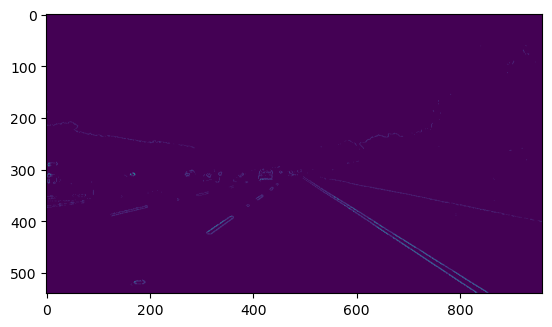

[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.         44.6842343   0.         ...  0.         42.08754771
   0.        ]
 [ 0.         40.86751205  0.         ...  0.          0.
   0.        ]]


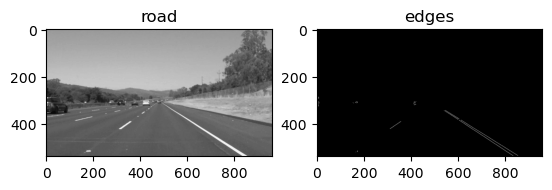

In [68]:
import matplotlib.pyplot as plt
# Load image
road = read_and_resize('road.jpg', grayscale=True)

# showInRow([road])

# plt.imshow(road)
# WRITE YOUR CODE
# Run Canny edge detector
edges = canny(road, low = 40, high = 100)
# edges = Canny(road, 240 , 252)
showInRow([road, edges], ['road', 'edges'])

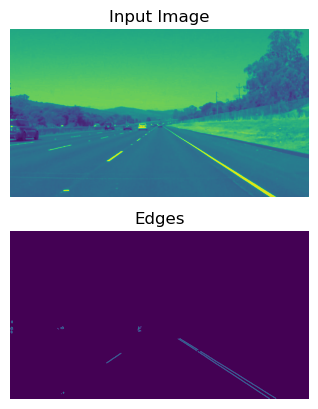

In [69]:
plt.subplot(211)
plt.imshow(road)
plt.axis('off')
plt.title('Input Image')

plt.subplot(212)
plt.imshow(edges)
plt.axis('off')
plt.title('Edges')
plt.show()

### 1.2 Extracting region of interest (ROI)
We can see that the Canny edge detector could find the edges of the lanes. However, we can also see that there are edges of other objects that we are not interested in. Given the position and orientation of the camera, we know that the lanes will be located in the lower half of the image. The code below defines a binary mask for the ROI and extract the edges within the region.

In [70]:
H, W = road.shape

# Generate mask for ROI (Region of Interest)
mask = np.zeros((H, W))
for i in range(H):
    for j in range(W):
        if i > (H / W) * j and i > -(H / W) * j + H:
            mask[i, j] = 1

# Extract edges in ROI
roi = edges * mask


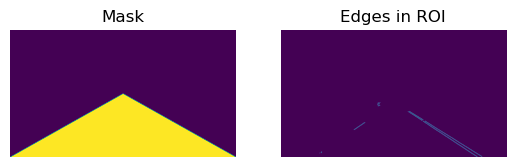

In [71]:
plt.subplot(1,2,1)
plt.imshow(mask)
plt.title('Mask')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(roi)
plt.title('Edges in ROI')
plt.axis('off')
plt.show()
